In [1]:
import scanpy as sc
import scvelo as scv
import pandas as pd
from pyarrow.parquet import ParquetFile
import pyarrow as pa 
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from pandas.api.types import CategoricalDtype
import anndata
import xenium_utils
import numpy as np
import os
import warnings
warnings.filterwarnings('ignore')

In [18]:
import importlib
importlib.reload(xenium_utils)

<module 'xenium_utils' from '/nfs/cellgeni/pasham/code/xenium/src/xenium_utils.py'>

In [4]:
xdata = sc.read_h5ad('../skin_hf_xenium/A_20250918_combined_rota_integ_spread_cut100_clean_anno.h5ad')
xdata

AnnData object with n_obs × n_vars = 813951 × 5101
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'sample', 'cutoff_sample', 'cutoff_genes100', 'cutoff_genes50', 'cutoff_pct20', 'cutoff_genes_sample', 'leiden_res_1.5', 'leiden_res_2.0', 'sample_cut', 'slide', 'split', 'donor', 'region', 'pcw', 'replicate', 'donor_region', 'x_new', 'y_new', 'region_replicate', 'donor_region_replicate', 'x_new_min', 'y_new_min', 'x_new_min_add', 'y_new_min_add', 'annotation_verybroad', 'annotation_broad', 'annotation_mid', 'annotation_fine', 'annotation_ve

In [4]:
xdata.obs['sample'].value_counts()

sample
output-XETG00335__0075707__F206-SKI-18-FO-2-S16__20250905__125434                           52655
output-XETG00272__0045059__F189-SKI-0-FO-2-S4-H2_F189-SKI-0-FO-1-S4-G1__20250206__144718    44901
output-XETG00335__0056997__f210-ski-0-fo-1-s11-c1__20250619__121837                         42472
output-XETG00272__0045058__F210-SKI-0-FO-1-S4-D2__20250206__144718                          38950
output-XETG00335__0056985__f206-ski-18-fo-2-s3-c1__20250619__121837                         38541
output-XETG00335__0075707__C215-SKI-18-FO-1-S3__20250905__125434                            33766
output-XETG00335__0075707__F206-SKI-18-FO-2-S9__20250905__125434                            33527
output-XETG00272__0045058__F210-SKI-0-FO-1-s5-B1__20250206__144718                          30776
output-XETG00272__0045059__F189-SKI-0-FO-2-S5-A1_F211-SKI-0-FO-3-S4-C2__20250206__144718    30078
output-XETG00335__0075707__F189-SKI-18-FO-2-S10__20250905__125434                           29641
output-XETG00

In [5]:
samples = pd.DataFrame({'sample':xdata.obs['sample'].unique().astype(str)})
samples['path'] = [xenium_utils.find_folder(x,'../skin_hf_xenium/') for x in samples['sample']]
samples

,sample,path
0,output-XETG00272__0045058__F210-SKI-0-FO-3-S4-...,../skin_hf_xenium/20250206_SGP213_5K100custom/...
1,output-XETG00272__0045059__F189-SKI-0-FO-1-S5-...,../skin_hf_xenium/20250206_SGP213_5K100custom/...
2,output-XETG00272__0045058__F208-SKI-0-FO-1-S4-...,../skin_hf_xenium/20250206_SGP213_5K100custom/...
3,output-XETG00272__0045059__F189-SKI-0-FO-2-S4-...,../skin_hf_xenium/20250206_SGP213_5K100custom/...
4,output-XETG00272__0045058__F208-SKI-0-FO-1-S5-...,../skin_hf_xenium/20250206_SGP213_5K100custom/...
5,output-XETG00272__0045059__F189-SKI-0-FO-2-S5-...,../skin_hf_xenium/20250206_SGP213_5K100custom/...
6,output-XETG00272__0045058__F208-SKI-0-FO-2-S4-...,../skin_hf_xenium/20250206_SGP213_5K100custom/...
7,output-XETG00272__0045059__F211-SKI-0-FO-1-S4-...,../skin_hf_xenium/20250206_SGP213_5K100custom/...
8,output-XETG00272__0045058__F208-SKI-0-FO-3-S4-...,../skin_hf_xenium/20250206_SGP213_5K100custom/...
9,output-XETG00272__0045059__F211-SKI-0-FO-2-S4-...,../skin_hf_xenium/20250206_SGP213_5K100custom/...


In [6]:
list(samples.loc[samples.path.isna(),'sample'])

[]

In [7]:
# rsync --chown cellgeni-su:cellgeni --exclude *.ndpi --exclude *.JPG --exclude *.tif --exclude *.tiff -auR --progress 
# /nfs/t298_imaging/0XeniumExports/./20250905_SGP281_5K_FS_and_paed 
# /nfs/t298_imaging/0XeniumExports/./20250206_SGP213_5K100custom 
# /nfs/t298_imaging/0XeniumExports/./20250619_SGP249_5K100custom_FSS_inner_ear/ 
# /nfs/t298_imaging/0XeniumExports/./20250925_SGP282_5K100custom_FSregionalID/
# ./

In [8]:
samples['has_parquet'] = [os.path.exists(x+'/transcripts.parquet') for x in samples.path]

In [19]:
cnts = []
for i in set(samples[samples["has_parquet"]].index):
    print(i)
    a = xenium_utils.loadXeniumCounts(xdata.obs.loc[xdata.obs['sample']==samples.loc[i,'sample'],:],samples.path[i])
    a.obs['sample'] = samples.loc[i,'sample']
    cnts.append(a)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
23
24
25
26
27
28
29
30
31
32
33


In [20]:
cndata = anndata.concat(cnts)
cndata

AnnData object with n_obs × n_vars = 786853 × 4818
    obs: 'cell_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'sample'
    obsm: 'spatial'
    layers: 'spliced', 'unspliced'

In [21]:
cndata.obs_names = cndata.obs['sample']+"_"+cndata.obs.cell_id

In [22]:
xdata = xdata[cndata.obs_names,cndata.var_names]
xdata

View of AnnData object with n_obs × n_vars = 786853 × 4818
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'sample', 'cutoff_sample', 'cutoff_genes100', 'cutoff_genes50', 'cutoff_pct20', 'cutoff_genes_sample', 'leiden_res_1.5', 'leiden_res_2.0', 'sample_cut', 'slide', 'split', 'donor', 'region', 'pcw', 'replicate', 'donor_region', 'x_new', 'y_new', 'region_replicate', 'donor_region_replicate', 'x_new_min', 'y_new_min', 'x_new_min_add', 'y_new_min_add', 'annotation_verybroad', 'annotation_broad', 'annotation_mid', 'annotation_fine', 'annot

In [23]:
cndata.obs = cndata.obs.loc[:,~cndata.obs.columns.isin(xdata.obs.columns)].join(xdata.obs)

# add gene info

In [10]:
genes = pd.read_csv('/nfs/cellgeni/pasham/code/gene.descr.csv')
genes.index = genes.name
genes

,Unnamed: 0,ens_id,descr,chr,start,end,strand,name,type
name,,,,,,,,,
MIR1302-2HG,ENSG00000243485,ENSG00000243485,MIR1302-2 host gene,1,29554,31109,1,MIR1302-2HG,lncRNA
FAM138A,ENSG00000237613,ENSG00000237613,family with sequence similarity 138 member A,1,34554,36081,-1,FAM138A,lncRNA
OR4F5,ENSG00000186092,ENSG00000186092,olfactory receptor family 4 subfamily F member 5,1,65419,71585,1,OR4F5,protein_coding
AL627309.1,ENSG00000238009,ENSG00000238009,novel transcript,1,89295,133723,-1,AL627309.1,lncRNA
AL627309.3,ENSG00000239945,ENSG00000239945,novel transcript,1,89551,91105,-1,AL627309.3,lncRNA
...,...,...,...,...,...,...,...,...,...
AC141272.1,ENSG00000277836,ENSG00000277836,NaN,KI270728.1,1270984,1271271,1,AC141272.1,protein_coding
AC023491.2,ENSG00000278633,ENSG00000278633,putative POM121-like protein 1,KI270731.1,10598,13001,-1,AC023491.2,protein_coding
AC007325.1,ENSG00000276017,ENSG00000276017,NaN,KI270734.1,72411,74814,1,AC007325.1,protein_coding


In [24]:
genes = genes.loc[cndata.var_names,:]
c=genes.name.value_counts()
genes.loc[genes.name.isin(c[c>1].index),:] 

,Unnamed: 0,ens_id,descr,chr,start,end,strand,name,type
GGT1,ENSG00000286070,ENSG00000286070,gamma-glutamyltransferase 1,22,24556007,24629005,1,GGT1,protein_coding
GGT1,ENSG00000100031,ENSG00000100031,gamma-glutamyltransferase 1,22,24594811,24629005,1,GGT1,protein_coding


In [26]:
# I'll drop one
genes = genes.loc[~genes.ens_id.isin(['ENSG00000100031']),:]
genes

,Unnamed: 0,ens_id,descr,chr,start,end,strand,name,type
A2ML1,ENSG00000166535,ENSG00000166535,alpha-2-macroglobulin like 1,12,8822621,8887001,1,A2ML1,protein_coding
AAMP,ENSG00000127837,ENSG00000127837,angio associated migratory cell protein,2,218264123,218270257,-1,AAMP,protein_coding
AAR2,ENSG00000131043,ENSG00000131043,AAR2 splicing factor,20,36236459,36270918,1,AAR2,protein_coding
AARSD1,ENSG00000266967,ENSG00000266967,alanyl-tRNA synthetase domain containing 1,17,42950526,42964498,-1,AARSD1,protein_coding
ABAT,ENSG00000183044,ENSG00000183044,4-aminobutyrate aminotransferase,16,8674596,8784575,1,ABAT,protein_coding
...,...,...,...,...,...,...,...,...,...
ZSCAN26,ENSG00000197062,ENSG00000197062,zinc finger and SCAN domain containing 26,6,28267010,28278224,1,ZSCAN26,protein_coding
ZSWIM6,ENSG00000130449,ENSG00000130449,zinc finger SWIM-type containing 6,5,61332258,61546172,1,ZSWIM6,protein_coding
ZUP1,ENSG00000153975,ENSG00000153975,zinc finger containing ubiquitin peptidase 1,6,116635618,116668794,-1,ZUP1,protein_coding
ZYG11B,ENSG00000162378,ENSG00000162378,"zyg-11 family member B, cell cycle regulator",1,52726453,52827336,1,ZYG11B,protein_coding


In [27]:
cndata.var = genes.loc[cndata.var_names,:]

In [28]:
cndata.var.type.value_counts()

type
protein_coding    4791
lncRNA              26
TR_C_gene            1
Name: count, dtype: int64

In [172]:
cndata.obs['nucleus_prop'] = cndata.obs.nucleus_area/cndata.obs.cell_area

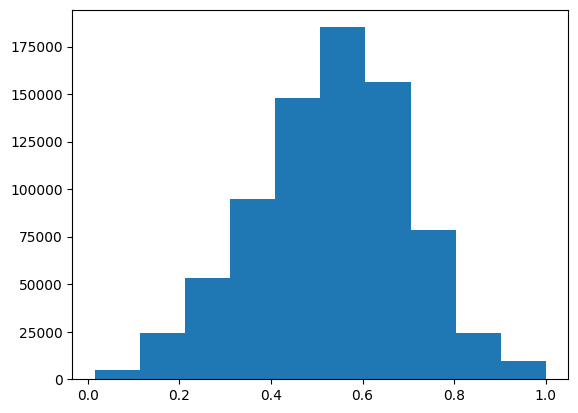

In [173]:
zzz=plt.hist(cndata.obs['nucleus_prop'])

In [29]:
cndata.write_h5ad('../skin_hr_xenium_with_nuclear_cytoplasme_reads.h5ad')

# check counts sums

In [30]:
xdata = xdata[cndata.obs_names,cndata.var_names]
xdata

View of AnnData object with n_obs × n_vars = 786853 × 4818
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'sample', 'cutoff_sample', 'cutoff_genes100', 'cutoff_genes50', 'cutoff_pct20', 'cutoff_genes_sample', 'leiden_res_1.5', 'leiden_res_2.0', 'sample_cut', 'slide', 'split', 'donor', 'region', 'pcw', 'replicate', 'donor_region', 'x_new', 'y_new', 'region_replicate', 'donor_region_replicate', 'x_new_min', 'y_new_min', 'x_new_min_add', 'y_new_min_add', 'annotation_verybroad', 'annotation_broad', 'annotation_mid', 'annotation_fine', 'annot

In [47]:
olds = np.array(xdata.layers['counts'].sum(0)).flatten()
news = np.array(cndata.X.sum(0)).flatten()
spls = np.array(cndata.layers['spliced'].sum(0)).flatten()
usps = np.array(cndata.layers['unspliced'].sum(0)).flatten()

In [48]:
pd.Series(olds==news).value_counts()

True    4818
Name: count, dtype: int64

In [49]:
pd.Series(olds==(spls+usps)).value_counts()

True    4818
Name: count, dtype: int64

In [51]:
oldg = np.array(xdata.layers['counts'].sum(1)).flatten()
newg = np.array(cndata.X.sum(1)).flatten()
splg = np.array(cndata.layers['spliced'].sum(1)).flatten()
uspg = np.array(cndata.layers['unspliced'].sum(1)).flatten()

In [52]:
pd.Series(oldg==newg).value_counts()

True    786853
Name: count, dtype: int64

In [53]:
pd.Series(oldg==(splg+uspg)).value_counts()

True    786853
Name: count, dtype: int64

# Look on FBs (fig 2)

In [2]:
cndata = sc.read_h5ad('../skin_hr_xenium_with_nuclear_cytoplasme_reads.h5ad')

In [5]:
fbs = ['FB: Dermal Condensate Early',
       'FB: Dermal Condensate Late',
       'FB: Dermal Condensate Mid',
       'FB: Dermal Condensate Transition',
       'FB: Dermal Papilla',
       'FB: Dermal Sheath Early']
annotation_veryfine_colors = dict(zip(xdata.obs.annotation_veryfine.cat.categories,xdata.uns['annotation_veryfine_colors']))

In [6]:
cndata.obs.annotation_veryfine.value_counts()[fbs]

annotation_veryfine
FB: Dermal Condensate Early          4838
FB: Dermal Condensate Late           4632
FB: Dermal Condensate Mid            6495
FB: Dermal Condensate Transition     1369
FB: Dermal Papilla                   4171
FB: Dermal Sheath Early             13956
Name: count, dtype: int64

# scvelo
## stochastic model

In [8]:
f = cndata.obs.annotation_veryfine.isin(fbs) & (cndata.obs.nucleus_count==1) & (cndata.obs.segmentation_method=='Segmented by interior stain (18S)')
#f = f & (cndata.obs['nucleus_prop']>0.55) & (cndata.obs['nucleus_prop']<0.7)
#f = f & (cndata.obs['sample'] == 'output-XETG00335__0075707__F206-SKI-18-FO-2-S9__20250905__125434')
fbdata = cndata[f,cndata.var.type=='protein_coding'].copy()
fbdata

AnnData object with n_obs × n_vars = 32948 × 4791
    obs: 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'sample', 'cutoff_sample', 'cutoff_genes100', 'cutoff_genes50', 'cutoff_pct20', 'cutoff_genes_sample', 'leiden_res_1.5', 'leiden_res_2.0', 'sample_cut', 'slide', 'split', 'donor', 'region', 'pcw', 'replicate', 'donor_region', 'x_new', 'y_new', 'region_replicate', 'donor_region_replicate', 'x_new_min', 'y_new_min', 'x_new_min_add', 'y_new_min_add', 'an

In [9]:
pd.crosstab(fbdata.obs['sample'],fbdata.obs['annotation_veryfine'])

annotation_veryfine,FB: Dermal Condensate Early,FB: Dermal Condensate Late,FB: Dermal Condensate Mid,FB: Dermal Condensate Transition,FB: Dermal Papilla,FB: Dermal Sheath Early
sample,,,,,,
output-XETG00272__0045058__F208-SKI-0-FO-1-S4-B2__20250206__144718,64,171,180,26,125,369
output-XETG00272__0045058__F208-SKI-0-FO-1-S5-E1__20250206__144718,20,81,94,9,160,110
output-XETG00272__0045058__F208-SKI-0-FO-2-S4-A2__20250206__144718,29,9,47,16,26,65
output-XETG00272__0045058__F208-SKI-0-FO-3-S4-C2__20250206__144718,123,87,128,12,57,232
output-XETG00272__0045058__F210-SKI-0-FO-1-S4-D2__20250206__144718,120,138,183,24,342,253
output-XETG00272__0045058__F210-SKI-0-FO-1-s5-B1__20250206__144718,20,9,68,16,1,35
output-XETG00272__0045058__F210-SKI-0-FO-2-S4-E2__20250206__144718,75,76,166,19,289,185
output-XETG00272__0045058__F210-SKI-0-FO-3-S4-F2__20250206__144718,84,57,114,18,100,264
output-XETG00272__0045059__F189-SKI-0-FO-1-S5-G2__20250206__144718,110,299,271,32,140,436


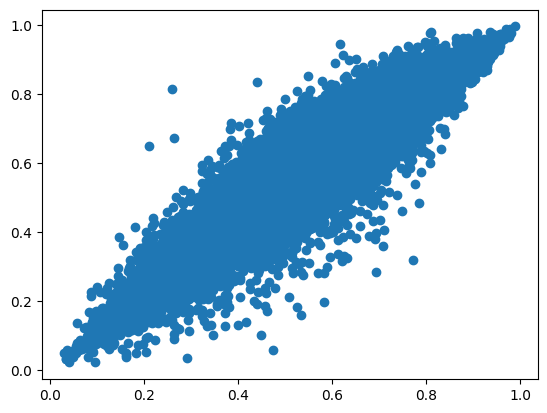

In [10]:
e = np.array(fbdata.layers['unspliced'].sum(1)/(fbdata.layers['spliced'].sum(1)+fbdata.layers['unspliced'].sum(1))).flatten()
a = fbdata.obs.nucleus_area/fbdata.obs.cell_area
plt.scatter(a,e)

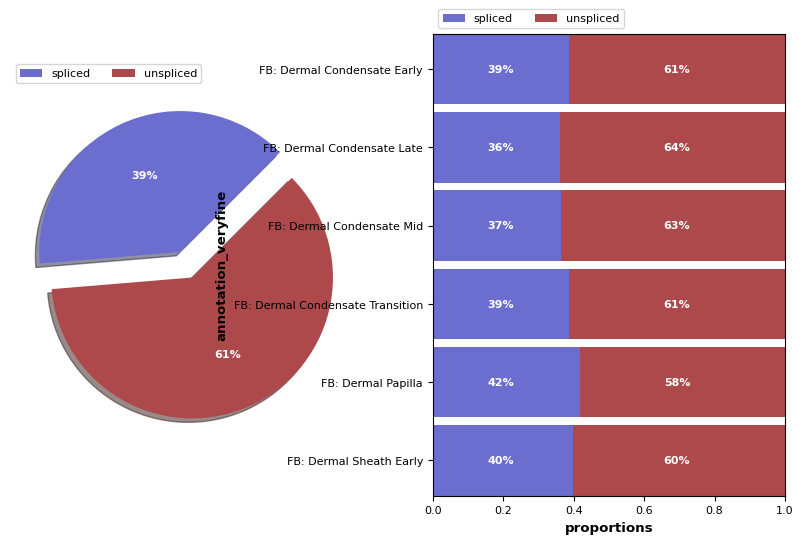

In [11]:
scv.pl.proportions(fbdata,groupby='annotation_veryfine',figsize=(10,6))

In [12]:
scv.pp.filter_and_normalize(fbdata, min_shared_counts=20, n_top_genes=2000)

Filtered out 1716 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


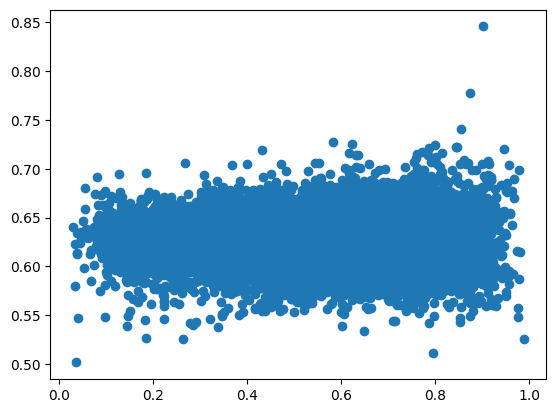

In [13]:
e = np.array(fbdata.layers['unspliced'].sum(1)/(fbdata.layers['spliced'].sum(1)+fbdata.layers['unspliced'].sum(1))).flatten()
a = fbdata.obs.nucleus_area/fbdata.obs.cell_area
plt.scatter(a,e)

In [209]:
#fbdata.layers['spliced'] = (fbdata.layers['spliced'] / np.array((fbdata.obs.cell_area-fbdata.obs.nucleus_area)).reshape((fbdata.shape[0],1))).tocsr()
#fbdata.layers['unspliced'] = (fbdata.layers['unspliced'] / np.array(fbdata.obs.nucleus_area).reshape((fbdata.shape[0],1))).tocsr()

In [14]:
scv.pp.moments(fbdata, n_pcs=30, n_neighbors=30)
fbdata

/tmp/ipykernel_576134/3538553269.py:1: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(fbdata, n_pcs=30, n_neighbors=30)
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/preprocessing/neighbors.py:233: DeprecationWarning: Automatic computation of PCA is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute PCA with Scanpy first.
  _set_pca(adata=adata, n_pcs=n_pcs, use_highly_variable=use_highly_variable)


computing neighbors
    finished (0:00:53) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:04) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 32948 × 2000
    obs: 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'sample', 'cutoff_sample', 'cutoff_genes100', 'cutoff_genes50', 'cutoff_pct20', 'cutoff_genes_sample', 'leiden_res_1.5', 'leiden_res_2.0', 'sample_cut', 'slide', 'split', 'donor', 'region', 'pcw', 'replicate', 'donor_region', 'x_new', 'y_new', 'region_replicate', 'donor_region_replicate', 'x_new_min', 'y_new_min', 'x_new_min_add', 'y_new_min_add', 'an

In [15]:
scv.tl.velocity(fbdata)

computing velocities


/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/tools/optimization.py:184: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  gamma[i] = np.linalg.pinv(A.T.dot(A)).dot(A.T.dot(y[:, i]))


    finished (0:00:08) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [16]:
scv.tl.velocity_graph(fbdata)

computing velocity graph (using 1/64 cores)
or disable the progress bar using `show_progress_bar=False`.


/software/conda/users/pm19/scvelo/lib/python3.13/multiprocessing/popen_fork.py:67: DeprecationWarning: This process (pid=576134) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (0:01:53) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [17]:
#sc.pp.neighbors(fbdata)
sc.tl.umap(fbdata)

computing velocity embedding
    finished (0:00:06) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:65: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return cat(data)  # if data is categorical/array
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils

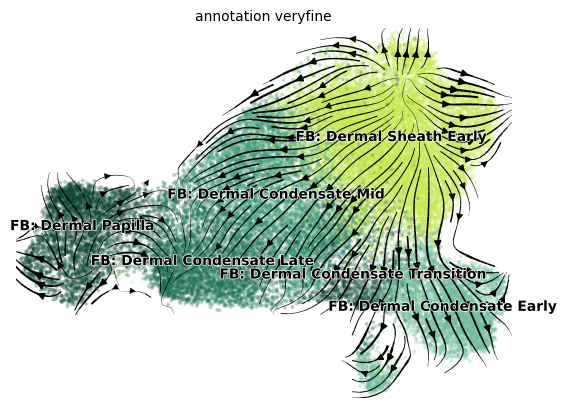

In [18]:
scv.pl.velocity_embedding_stream(fbdata, basis='umap',color='annotation_veryfine',palette=annotation_veryfine_colors)

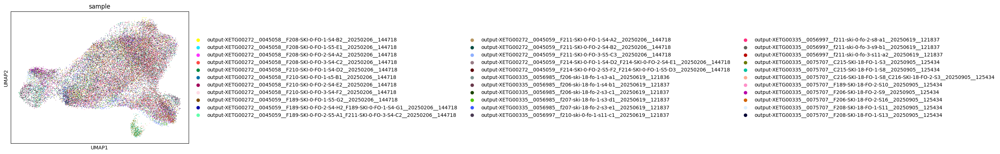

In [19]:
sc.pl.umap(fbdata,color='sample')

/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/software/conda/users/pm19/scvelo/lib/python3.13/site-package

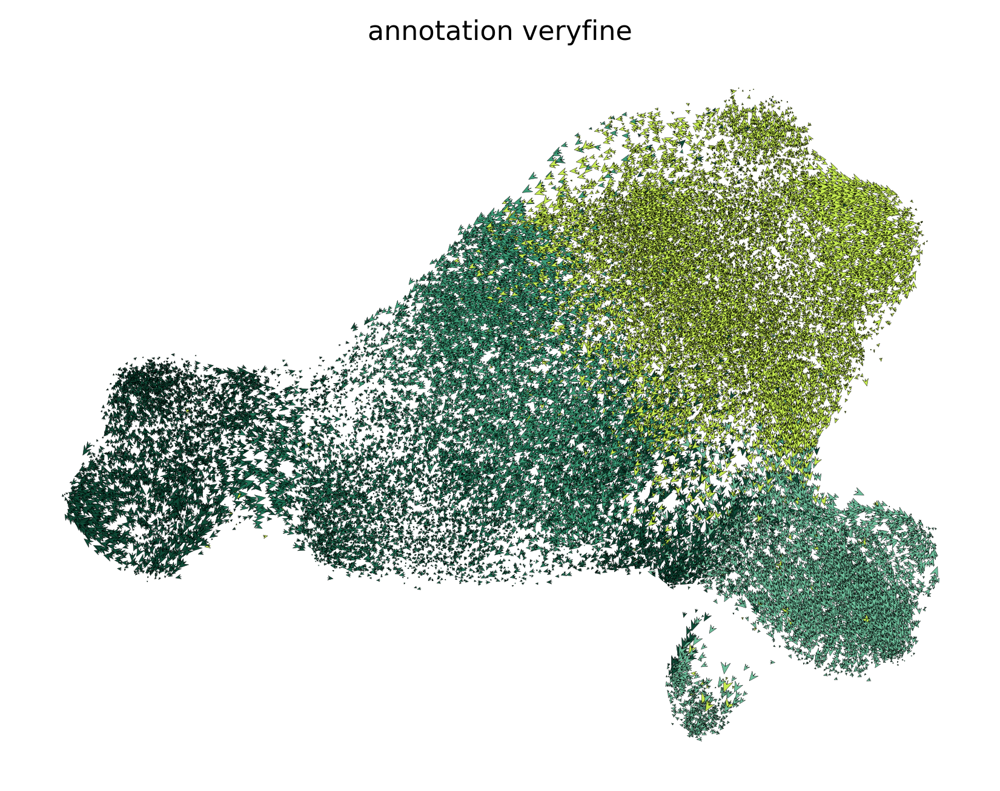

In [20]:
scv.pl.velocity_embedding(fbdata, arrow_length=5, arrow_size=10, dpi=320,basis='umap',color='annotation_veryfine',palette=annotation_veryfine_colors)

In [21]:
scv.tl.rank_velocity_genes(fbdata, groupby='annotation_veryfine', min_corr=.3)

ranking velocity genes


/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/tools/utils.py:463: DeprecationWarning: Please import `rankdata` from the `scipy.stats` namespace; the `scipy.stats.stats` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.stats.stats import rankdata


    finished (0:00:13) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [22]:
df = pd.DataFrame(fbdata.uns['rank_velocity_genes']['names'])
df

,FB: Dermal Condensate Early,FB: Dermal Condensate Late,FB: Dermal Condensate Mid,FB: Dermal Condensate Transition,FB: Dermal Papilla,FB: Dermal Sheath Early
0,DNM1,INHBA,PLXDC1,CD34,CACNA1C,SLC26A7
1,DLG4,NRP2,IL11RA,LRATD2,SMAD7,CCND1
2,IQGAP2,IGSF3,ADAMTS5,FGF19,DPY19L2,MTCL1
3,PTGIS,TCF7,AGAP1,FREM1,RRAS,GREM2
4,GAS6,RFTN1,TNXB,ENPP2,JAK3,GXYLT2
...,...,...,...,...,...,...
95,ZFAND5,ABCA1,LAMA3,SLC3A2,ST14,TPX2
96,TNXB,TRIB2,PDGFRA,IGFBP2,CNKSR3,KIF2C
97,APCDD1,NRP1,SPTA1,DMD,PRCP,SMOC2
98,CASZ1,TMEM119,BMP3,PDGFC,DDX3Y,PLK1


/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:65: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return cat(data)  # if data is categorical/array
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils

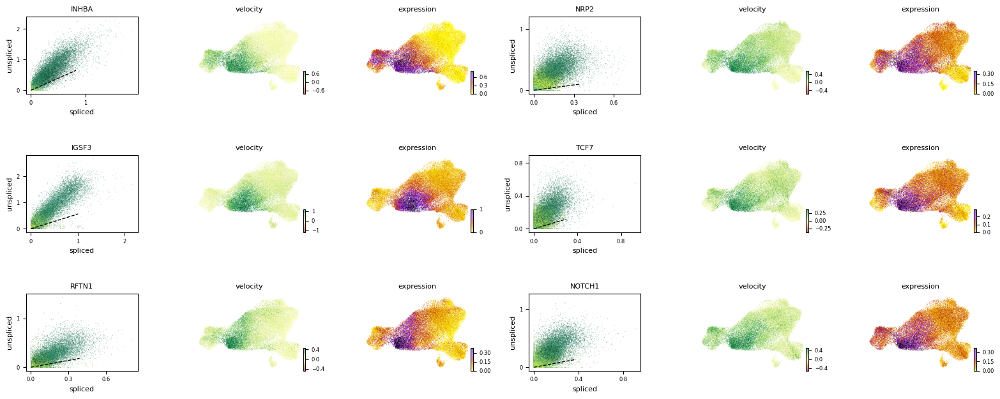

In [23]:
scv.pl.velocity(fbdata,df.iloc[:6,1], ncols=2,color='annotation_veryfine',palette=annotation_veryfine_colors)

## dynamical model 

In [241]:
f = cndata.obs.annotation_veryfine.isin(fbs) & (cndata.obs.nucleus_count==1) & (cndata.obs.segmentation_method=='Segmented by interior stain (18S)')
#f = f & (cndata.obs['nucleus_prop']>0.55) & (cndata.obs['nucleus_prop']<0.7)
#f = f & (cndata.obs['sample'] == 'output-XETG00335__0075707__F206-SKI-18-FO-2-S9__20250905__125434')
fbdata = cndata[f,cndata.var.type=='protein_coding'].copy()
fbdata

AnnData object with n_obs × n_vars = 32948 × 4791
    obs: 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'sample', 'cutoff_sample', 'cutoff_genes100', 'cutoff_genes50', 'cutoff_pct20', 'cutoff_genes_sample', 'leiden_res_1.5', 'leiden_res_2.0', 'sample_cut', 'slide', 'split', 'donor', 'region', 'pcw', 'replicate', 'donor_region', 'x_new', 'y_new', 'region_replicate', 'donor_region_replicate', 'x_new_min', 'y_new_min', 'x_new_min_add', 'y_new_min_add', 'an

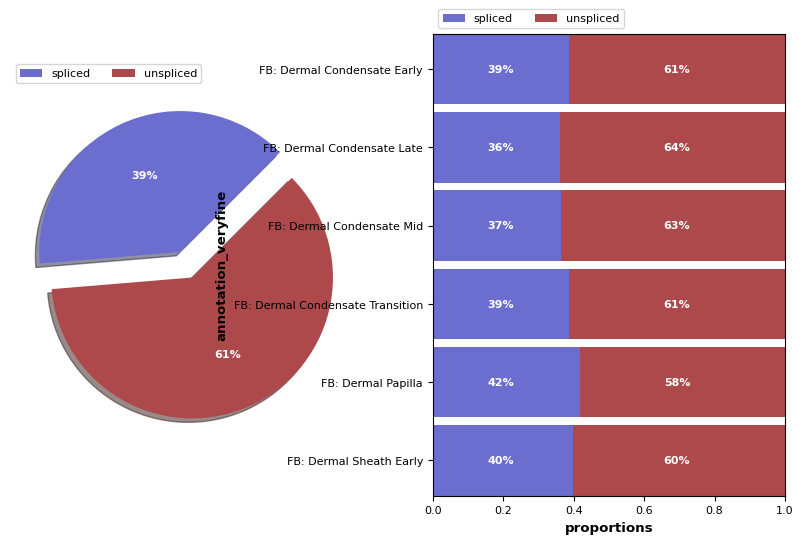

In [242]:
scv.pl.proportions(fbdata,groupby='annotation_veryfine',figsize=(10,6))

In [243]:
scv.pp.filter_and_normalize(fbdata, min_shared_counts=20, n_top_genes=2000)

Filtered out 1716 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.


/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


Logarithmized X.


In [244]:
scv.pp.moments(fbdata, n_pcs=30, n_neighbors=30)
fbdata

/tmp/ipykernel_576273/3538553269.py:1: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(fbdata, n_pcs=30, n_neighbors=30)
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/preprocessing/neighbors.py:233: DeprecationWarning: Automatic computation of PCA is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute PCA with Scanpy first.
  _set_pca(adata=adata, n_pcs=n_pcs, use_highly_variable=use_highly_variable)


computing neighbors
    finished (0:00:16) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:14) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 32948 × 2000
    obs: 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'sample', 'cutoff_sample', 'cutoff_genes100', 'cutoff_genes50', 'cutoff_pct20', 'cutoff_genes_sample', 'leiden_res_1.5', 'leiden_res_2.0', 'sample_cut', 'slide', 'split', 'donor', 'region', 'pcw', 'replicate', 'donor_region', 'x_new', 'y_new', 'region_replicate', 'donor_region_replicate', 'x_new_min', 'y_new_min', 'x_new_min_add', 'y_new_min_add', 'an

In [245]:
scv.tl.recover_dynamics(fbdata)
scv.tl.velocity(fbdata, mode='dynamical')
scv.tl.velocity_graph(fbdata)

recovering dynamics (using 1/256 cores)


/software/conda/users/pm19/scvelo/lib/python3.13/multiprocessing/popen_fork.py:67: DeprecationWarning: This process (pid=576273) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (1:00:20) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:43) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/256 cores)


/software/conda/users/pm19/scvelo/lib/python3.13/multiprocessing/popen_fork.py:67: DeprecationWarning: This process (pid=576273) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (0:02:10) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [246]:
#sc.pp.neighbors(fbdata)
sc.tl.umap(fbdata)

computing velocity embedding
    finished (0:00:12) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:65: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return cat(data)  # if data is categorical/array
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils

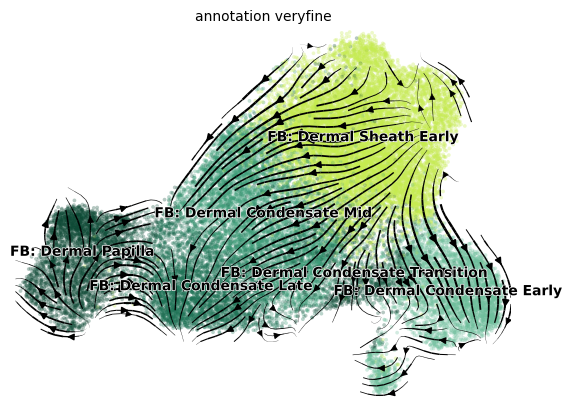

In [247]:
scv.pl.velocity_embedding_stream(fbdata, basis='umap',color='annotation_veryfine',palette=annotation_veryfine_colors)

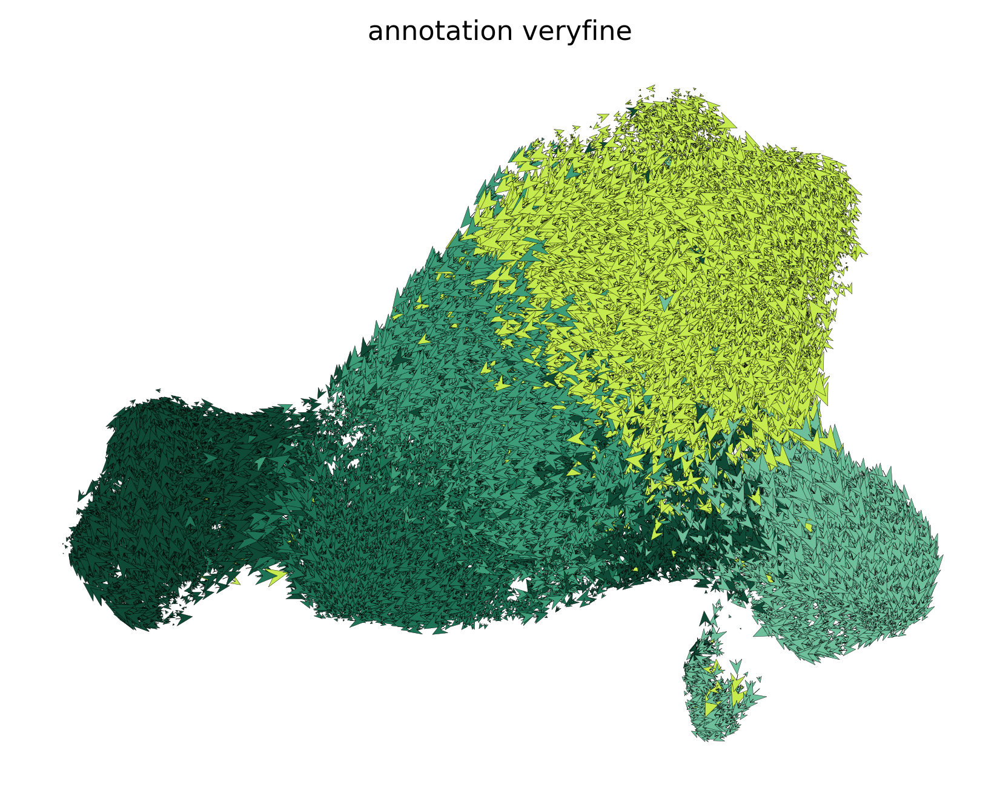

In [262]:
scv.pl.velocity_embedding(fbdata, arrow_length=15, arrow_size=20, dpi=320,basis='umap',color='annotation_veryfine',palette=annotation_veryfine_colors)

computing terminal states
    identified 7 regions of root cells and 1 region of end points .
    finished (0:00:09) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:13) --> added 
    'latent_time', shared time (adata.obs)


/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/software/conda/users/pm19/scvelo/lib/python3.13/site-package

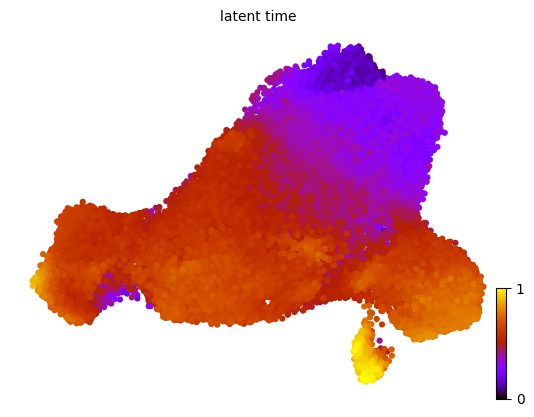

In [249]:
scv.tl.latent_time(fbdata)
scv.pl.scatter(fbdata, color='latent_time', color_map='gnuplot', size=80)

In [250]:
scv.tl.rank_velocity_genes(fbdata, groupby='annotation_veryfine', min_corr=.3)

ranking velocity genes


/software/conda/users/pm19/scvelo/lib/python3.13/site-packages/scvelo/tools/utils.py:463: DeprecationWarning: Please import `rankdata` from the `scipy.stats` namespace; the `scipy.stats.stats` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.stats.stats import rankdata


    finished (0:01:12) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [251]:
df = pd.DataFrame(fbdata.uns['rank_velocity_genes']['names'])
df

,FB: Dermal Condensate Early,FB: Dermal Condensate Late,FB: Dermal Condensate Mid,FB: Dermal Condensate Transition,FB: Dermal Papilla,FB: Dermal Sheath Early
0,DNM1,ABO,AGAP1,TNXB,ABO,CHEK1
1,COL7A1,FRAS1,BCAM,AGAP1,NCOA3,CCND2
2,MYLK,MSI1,TFAP2A,ZFAND5,FGFR3,TUBB
3,PTPN5,CD34,CHRNA7,EBF1,LAMA3,ANXA2
4,ETV5,DTX1,PLXDC1,PTPN5,LTBP1,CYP1B1
...,...,...,...,...,...,...
95,GRHL2,KIF20A,NFATC4,LGR4,GPRC5C,SLC26A7
96,RANGAP1,NECTIN1,LTBP1,DCC,MYBL2,AQP1
97,NOTCH1,CHRNA7,SMAD7,KIF2C,FLRT3,TNMD
98,CDKN1C,BCAM,FABP7,MEGF10,DLK1,LGR6


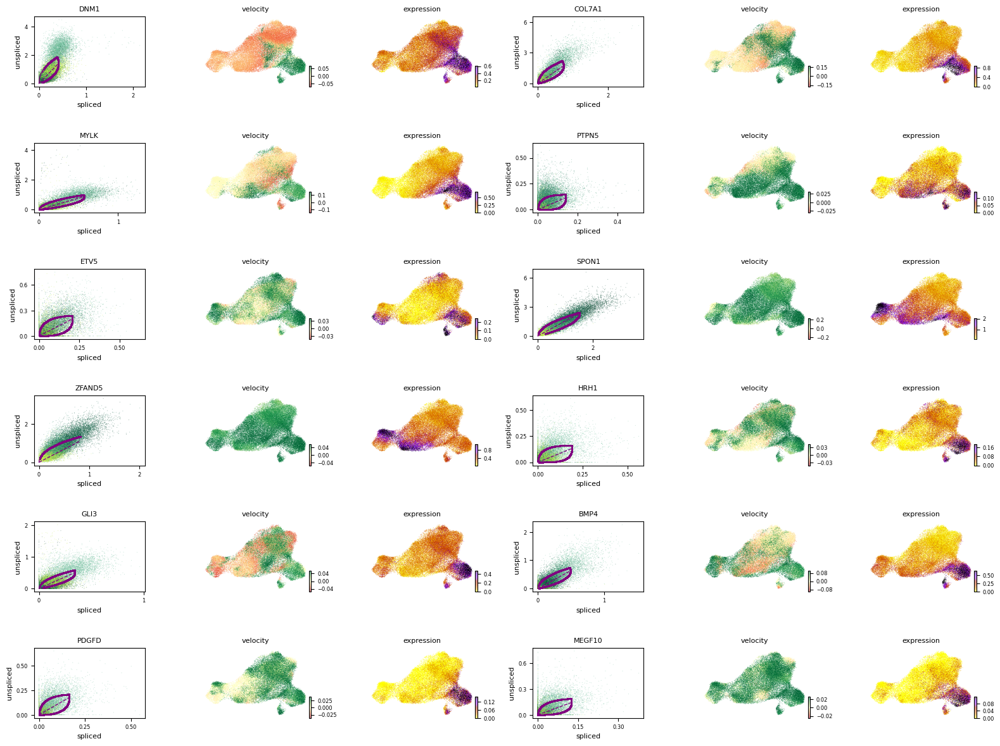

In [257]:
scv.pl.velocity(fbdata,df.iloc[:12,0], ncols=2,color='annotation_veryfine',palette=annotation_veryfine_colors,use_raw=False)

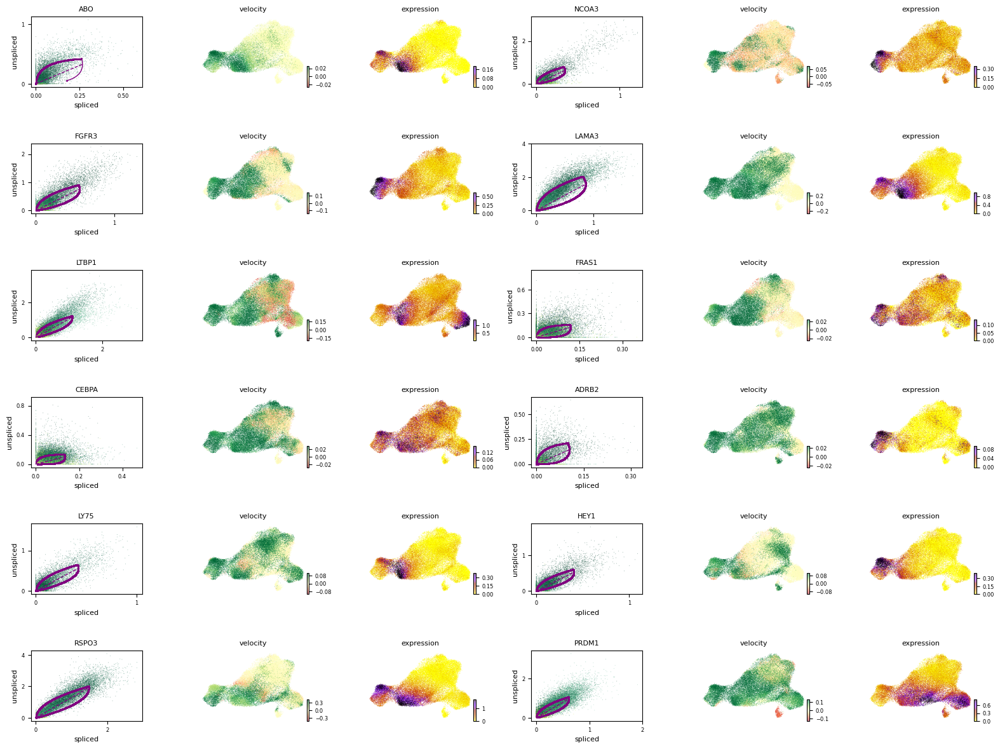

In [258]:
scv.pl.velocity(fbdata,df.iloc[:12,4], ncols=2,color='annotation_veryfine',palette=annotation_veryfine_colors,use_raw=False)

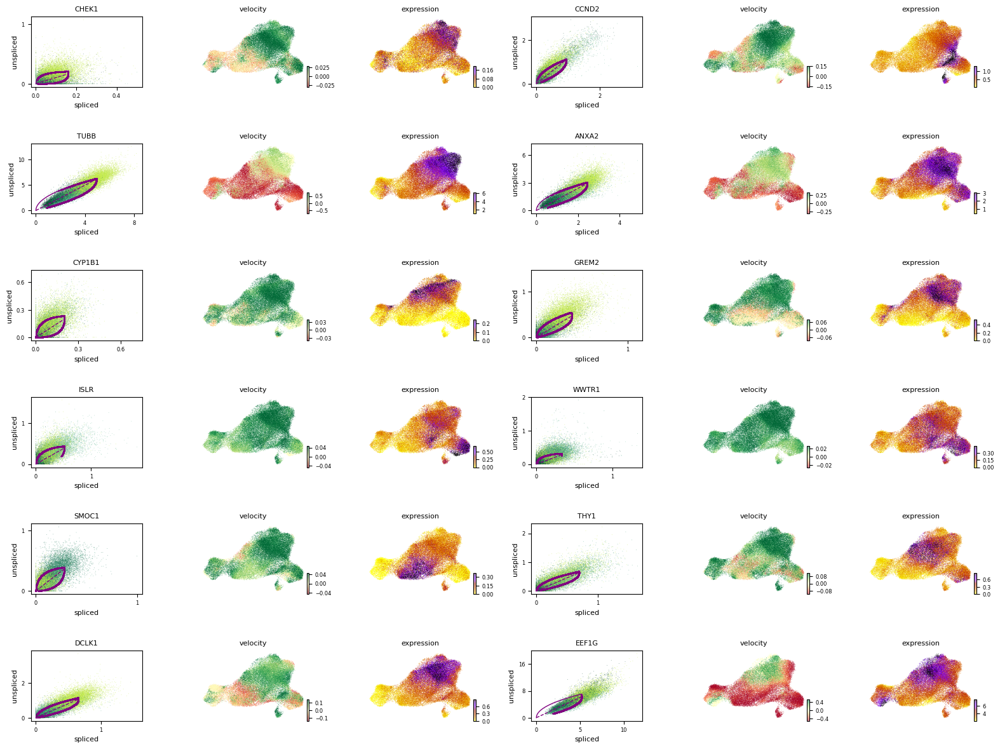

In [259]:
scv.pl.velocity(fbdata,df.iloc[:12,5], ncols=2,color='annotation_veryfine',palette=annotation_veryfine_colors,use_raw=False)

In [260]:
fbdata.write_h5ad('../fbdata_scvelo.h5ad')

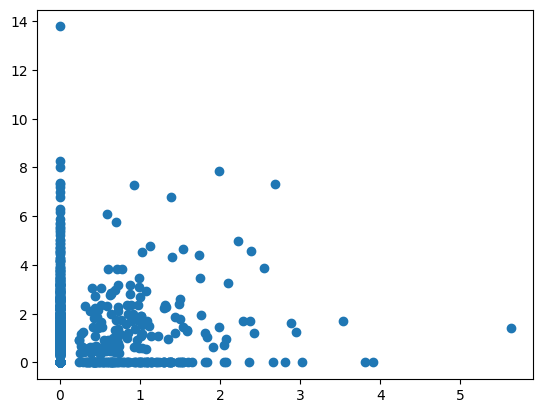

In [139]:
plt.scatter(fbdata[:,'DNM1'].layers['spliced'].toarray(),fbdata[:,'DNM1'].layers['unspliced'].toarray())

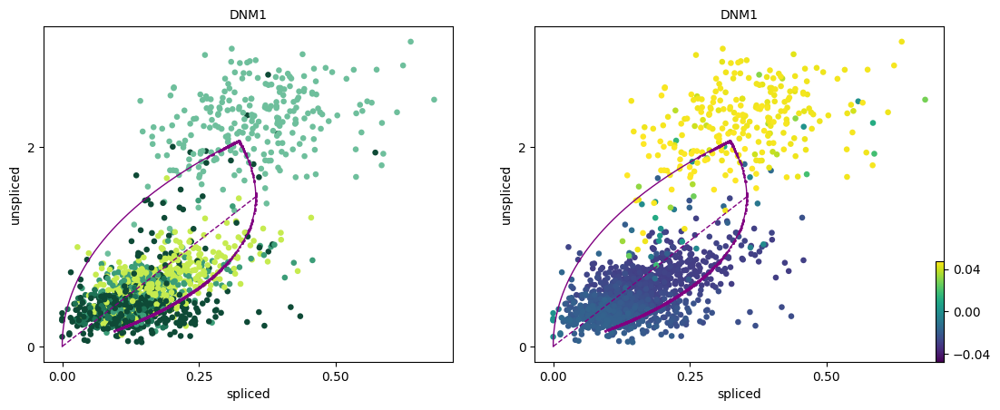

In [140]:
scv.pl.scatter(fbdata, 'DNM1', color=['annotation_veryfine', 'velocity'],palette=annotation_veryfine_colors)